
<img src="https://www.virtualeducationexpo.ie/wp-content/uploads/2020/08/CCT_Logo_New_Aug_17.jpg" width="400">

<center> CA - Data Visualization Techniques, Machine Learning for Business <center>

<center>Lecturers: David McQuaid, Muhammad Iqbal <center>

    
    
<center> Elvira Sharafutdinova ID: 2022131 <center>

    
    
<center><center>

# Task 1 - Recomendation Systems

## What is the purpose of a recommendation system for online retail business in machine learning?

More and more consumers nowadays expect **personalization** — to see products and services relevant to their interests. Actually, they can help businesses too. By learning from user behaviours and preferences, businesses can deliver their recommendations in a variety of ways, including personalized coupons, marketing emails, and search results, or targeted ads.


**Recommendation systems** are the systems that are designed to recommend things to the user based on many different factors. These systems predict the most likely product that the users are most likely to purchase and are of interest to. Companies like Netflix, Amazon, etc. use recommender systems to help their users to identify the correct product or movies for them (Dwivedi). 

The Internet is the **new digital market**, where it presents us with a number of choices, sometimes too overwhelming to choose from. Today everything we need or want to buy can easily be accessible to us through this new digital market. Recommendation systems are **information filtering** systems that help deal with the problem of information overload by  filtering and segregating information and creating fragments out of large amounts of dynamically generated information according to user’s preferences, interests, or observed behavior about a particular item or items.

A Recommendation system has the ability to **predict** whether a particular user would prefer an item or not based on the user’s profile and its historical information. Recommendation systems have also proved to improve the decision making processes and quality.

Conglomerates like **Netflix** use a recommendation engine to present their viewers with movie and show suggestions. Amazon, on the other hand, uses its recommendation engine to present customers with product recommendations. While each uses the one for slightly different purposes, both in general have the same goal: **to drive sales, boost engagement and customer retention, and deliver more personalized customer experiences**. Recommendations typically speed up the searches and make it easier for users to access the content they have always been interested in, and surprise them with several offers they would have never searched for. Doing companies are able to gain new customers by sending out customized emails with links to new offers that meet the recipients’ interests, or suggestions of films and TV shows that suit their particular profiles (Dey).

### Collaborative VS Content-Based Filtering

In [1]:
from IPython.display import Image
Image(url= "https://miro.medium.com/max/998/1*O_GU8xLVlFx8WweIzKNCNw.png", width=800, height=500)

here are two main types of recommendation engines, namely **collaborative filtering** and **content-based filtering**.

**The Collaborative filtering** method for recommender systems is a method that is solely based on the past interactions that have been recorded between users and items, in order to produce new recommendations. Collaborative Filtering tends to find what similar users would like and the recommendations to be provided and in order to classify the users into clusters of similar types and recommend each user according to the preference of its cluster. The main idea that governs the collaborative methods is that through past user-item interactions when processed through the system, it becomes sufficient to detect similar users or similar items to make predictions based on these estimated facts and insights (Dey).

The standard method used by Collaborative Filtering is known as the Nearest Neighborhood algorithm. There are several types of filtering such as user-based and Item-based Collaborative Filtering (Dey).

**The Content-based approach** uses additional information about users and/or items. This filtering method uses item features to recommend other items similar to what the user likes and also based on their previous actions or explicit feedback. If we consider the example for a movies recommender system, the additional information can be, the age, the sex, the job or any other personal information for users as well as the category, the main actors, the duration or other characteristics for the movies i.e the items. 

The main idea of content-based methods is to try to build a model, based on the available “features”, that explain the observed user-item interactions. Still considering users and movies, we can also create the model in such a way that it could provide us with an insight into why so is happening. Such a model helps us in making new predictions for a user pretty easily, with just a look at the profile of this user and based on its information, to determine relevant movies to suggest. 


The Content-based approach requires a good amount of information about item's features, rather than using the user’s interactions and feedback. They can be movie attributes such as genre, year, director, actor etc. or textual content of articles that can be extracted by applying Natural Language Processing. (***So, in my case I choose the Netflix dataset, which has all this information***). Collaborative Filtering, on the other hand, doesn’t need anything else except the user’s historical preference on a set of items to recommend from, and because it is based on historical data, the core assumption made is that the users who have agreed in the past will also tend to agree in the future. 


The Collaborative filtering model can help users discover new interests and although the ML system might not know the user’s interest in a given item, the model might still recommend it because similar users are interested in that item. On the other hand, a Content-based model can only make recommendations based on the existing interests of the user and the model hence only has limited ability to expand on the user's existing interests. (***For my dataset the goal is to find recommendation movies close to your choise***).

A Content-Based filtering model does not need any data about other users, since the recommendations are specific to a particular user. This makes it easier to scale down the same to a large number of users. A similar cannot be said or done for Collaborative Filtering Methods. 

The collaborative algorithm uses only user behavior for recommending items while for Content-based filtering we have to know the content of both user and item.

## Content Based Filtering (Netflix Recomendation System)

### Importing libraries

In [2]:
import pandas as pd 
import numpy as np
import scipy
from tqdm import tqdm_notebook
pd.set_option('display.max_columns', 50)
import missingno

from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from mlxtend.frequent_patterns import fpgrowth
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import linear_kernel
from pyspark import SparkContext
from pyspark.sql import functions as f, SparkSession, Column

import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import axes
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import graph_objs as go
init_notebook_mode(connected = True)
import matplotlib.dates as mdates
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as plt_io
import networkx as nx

import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
from textblob import TextBlob

### Data Understanding and Preparation

In [3]:
from IPython.display import Image
Image(url= "https://yandex-images.clstorage.net/Z5jWN2150/544633DCx1z/FPKVINVBcRPzBY3Xy60oplc3qFu4IzhNlcP_adygu4RiakxIKJXbUR1EGo_8Qc9T2GhYK1rcoSc3YfjextiLY8HhxjJFBmQGYsMY1ctsaCEAZ2wcrqIvCwVU_TmfNWyRoO_MSvhWz0JYRU_Up0kHzQK3lDWSQv41o3R4ydbLWbPbeEVv3Fxw13tfR16M7q9hCfxvEu2tJE9UV7q_iLR_xHp8hYH-So8OlxvZ1ygMScyBd1372E17tyhyvAvaHFZyF3qTJ1kac9Ozm46bDGYjJs74b1bpIuoCkFq4OM3-fYkyekcCdUROjdGUkBOryIRBjj-a8h_L9zNme3QIGVlRNRwz3ucQ3PkXdVJJG0DnI65MMeDTJu0shh9W9fdKs7dNObSEgHDKj8FW21jfZo0EQA6-1PrdDHCw4P-yzNkW3vAZ8lDt0Nq03_Nczd_IrazshbngHimnasnWGjM7BbZwBDd4DU--yQWPl1kWmSEITcAONJIz3oowM6O2vQKRmB670PUQLduXfpd-GAHdDGgg5ce_od2u4avHntc1eEU-do64_cdAfAQGiRze0FgoxIPHDPSd9Z3JfD9pNnINWVScdB1yGWGZ37YT8ZtOk4ZgomjGf2ieZqpnD12YdPXI9jZLvj_EiPbASIEfWt9ZpQLPRUt4VvvSSreyp3L5BJrdXzVVOxviUhZzH7cVT58Ip-UmzDzrnOZor8ZWlfJ0iXK5RrU6gkt9AkxAWVEeHymDzksLMlN6mgl4vW0xe0bUk513nv6Y7Jjf_hKyGo3SgS4pKkr2bBShYGzHXpV89Eg6tUR5PszN-QnKSZdR0JJqQgRHwbZbfBbOPLdgOXEA2JbQcBI7lu0d2_8T91tNGgjirGvONWUU5-grQpyVsjjAN_oJPvyNy7SGTwEc0pPeLYBGh8T1VHZfSb37Z_ZzghRZljcWNBauktz_WX5YANaNKmNiRnhj1OjtIYdXXDU9ys", width=800, height=500)

**Netflix** is one of the world's leading streaming entertainment service with 208 million paid memberships in over 190 countries enjoying TV series, documentaries and feature films across a wide variety of genres and languages. It has over 8000 movies or TV shows available on their platform (2021), it also has over 200 millions subscribers globally. This tabular dataset consists of listings of all the movies and tv shows available on Netflix, along with details such as - cast, directors, ratings, release year, duration, etc.

**Data Dictionary:**

**show_id** - Unique ID for every Movie/TV Show

**type** - Type of Content: Movie/TV Show

**title** - Name of the Movie/TV Show

**director** - Name of the Director of the Movie/TV Show

**cast** - Actors involved in the Movie/TV Show

**country** - Name of the Countries where the Movie/TV Show is produced

**date_added** - The Date in which the Movie/TV Show was added on Netflix

**release_year** - Original Release Year of the Movie/TV Show

**rating** - Rating of the Movie/TV Show

**duration** - Total Duration of the Movie (in Minutes) or TV Show (in Seasons)

**listed_in** - Genre of the Movie/TV Show

**description** - Summary of the Movie/TV Show

In [4]:
data_net = pd.read_csv("netflix_titles.csv")
data_net.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [5]:
data_net.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


From `data.info` it could be seen that the Netflix data includes 11 object and 1 numeric (integer) type of data and also some  missing values. The data has 8807 entries with 12 features. Let's check and plot missing values.

In [6]:
data_net.isna().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

For plotting the missing values I will use bar chart from `missingo` library which is an exploratory visualization of missing data. I want to color the features which are included the missing values ("director", "cast", "country", "date added", "rating", "duration"). For these features I will use different type of **red** color in order to highlight them as missing warning. Also the tone of the red will change from dark ("director") to light ("duration") depends on the number of missing values. For the other features without any missing values I will use **grey** color as mention it "everything is ok".

Text(0.5, 1.0, 'Missing Values in the Netflix data')

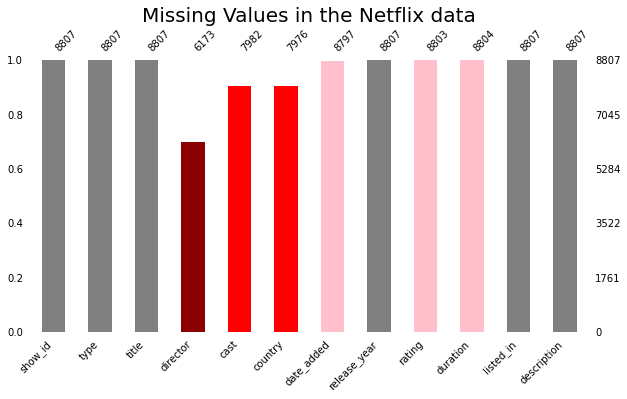

In [7]:
color= ['grey','grey','grey','darkred','red','red','pink','grey','pink','pink','grey','grey']
missingno.bar(data_net,fontsize=10,color=color,figsize=(10,5))
plt.title('Missing Values in the Netflix data',fontsize=20)

From the barchart above it could be seen, that we can't randomly fill the missing values in columns of **"director", "cast" and "country"** and we will replace them by  **"Not Known", "Not Known" and "Country Unavailable"**.
The rows with the missing values in **"date_added", "raing", "duration"** can be dropped.

In [8]:
data_net['country'].fillna('Country Unavailable', inplace=True)
data_net['cast'].replace(np.nan, 'Not Known',inplace  = True)
data_net['director'].replace(np.nan, 'Not Known',inplace  = True)


In [9]:
data_net.dropna(inplace=True)

In [10]:
data_net.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

All missing values has been fixed. Let's check the data for any duplicates rows.

In [11]:
data_net.duplicated().sum()

0

In [12]:
data_net.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8790 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8790 non-null   object
 1   type          8790 non-null   object
 2   title         8790 non-null   object
 3   director      8790 non-null   object
 4   cast          8790 non-null   object
 5   country       8790 non-null   object
 6   date_added    8790 non-null   object
 7   release_year  8790 non-null   int64 
 8   rating        8790 non-null   object
 9   duration      8790 non-null   object
 10  listed_in     8790 non-null   object
 11  description   8790 non-null   object
dtypes: int64(1), object(11)
memory usage: 892.7+ KB


17 rows were dropped and the data doesn't include any missing values now.
I want to transform column "date_added" in the date formate and create new colums such as "year_added", "month_added" and "day_added".

In [13]:
data_net["date_added"] = pd.to_datetime(data_net['date_added'])

data_net['day_added']=data_net['date_added'].dt.day
data_net['month_added']=data_net['date_added'].dt.month
data_net['year_added'] = data_net['date_added'].dt.year

In [14]:
data_net.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,day_added,month_added,year_added
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,Not Known,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",25,9,2021
1,s2,TV Show,Blood & Water,Not Known,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",24,9,2021
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",Country Unavailable,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,24,9,2021
3,s4,TV Show,Jailbirds New Orleans,Not Known,Not Known,Country Unavailable,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",24,9,2021
4,s5,TV Show,Kota Factory,Not Known,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,24,9,2021


Next I'm going to rename  the "listed_in" column as 'Genre'for easy understanding.

Also I want to create new 2 futures as "grenre_main" and "cointry_main" as the first word from the columns "genre" and "country" in order to simplify the next analysis.

In [15]:
data_net = data_net.rename(columns={"listed_in":"genre"})

In [16]:
data_net['genre_main'] = data_net['genre'].apply(lambda x: x.split(",")[0])
data_net['genre_main']

0                  Documentaries
1         International TV Shows
2                 Crime TV Shows
3                     Docuseries
4         International TV Shows
                  ...           
8802                 Cult Movies
8803                    Kids' TV
8804                    Comedies
8805    Children & Family Movies
8806                      Dramas
Name: genre_main, Length: 8790, dtype: object

In [17]:
data_net['country_main'] = data_net['country'].apply(lambda x: x.split(",")[0])
data_net['country_main'].head()

0          United States
1           South Africa
2    Country Unavailable
3    Country Unavailable
4                  India
Name: country_main, dtype: object

In [18]:
data_net['rating'].value_counts()

TV-MA       3205
TV-14       2157
TV-PG        861
R            799
PG-13        490
TV-Y7        333
TV-Y         306
PG           287
TV-G         220
NR            79
G             41
TV-Y7-FV       6
NC-17          3
UR             3
Name: rating, dtype: int64

In [19]:
data_net['type'].value_counts()

Movie      6126
TV Show    2664
Name: type, dtype: int64

In [20]:
data_net['title'].nunique()

8790

It could be seen that the data has 2664 TV Shows and 6126 Movies, so Movies are significantly more than TV Shows on Netflix. Let's split the data one with movies collection and other with TV shows collection.

### EDA

#### Movie and TV Show

Let's visualize the proportions between Movie and TV Show from the data. I'm gong to choose Donut Chart, because it's suitable for just 2 types (Movie and TV Show). The colors would be close to read, black and gray (#b20710, #221f1f', #333)  in order to save the theme of  Netflix platform. The color of font is chosen close to black ('#333').

**Donut parameters**:

- textposition: the values of Movie & TV Show are shown outside of the chart by giving textposition=outside
- textinfo: what information is shown while hovering on the chart
- rotation: giving different rotation to the chart to make chart presentable
- pull: what data and percent of data are pulled
- hole: can be specify any values between 0 to 1 to make hole.

In [21]:
fig_donut = px.pie(data_net, names='type', height=400, width=700, hole=0.65, title='Movies vs TV Shows',
                   color_discrete_sequence=['#b20710', '#221f1f'])
fig_donut.update_traces(hovertemplate=None, textposition='outside', textinfo='percent+label', rotation=90)
fig_donut.update_layout(margin=dict(t=100, b=30, l=0, r=0), showlegend=False,
                        #plot_bgcolor='#8a8d93', paper_bgcolor='#8a8d93',
                        title_font=dict(size=45, color='#333', family="Lato, sans-serif"),
                        font=dict(size=17, color='#333'),
                        hoverlabel=dict(bgcolor="#8a8d93", font_size=13, font_family="Lato, sans-serif"))

It could be seen that the ratio to Movie is 69.7%. Movies are preferred more than TV Shows clearly. So now see what is the trend of movies thought time period.

#### TV Shows & Movies impact over the years

I'm going to create a line chart to see the dynamic amount of Movies and Tv Showes released over the years.

In [22]:
d1 = data_net[data_net["type"] == "TV Show"]
d2 = data_net[data_net["type"] == "Movie"]

col = "year_added"

vc1 = d1[col].value_counts().reset_index().rename(columns = {col : "count", "index" : col})
vc1['percent'] = vc1['count'].apply(lambda x : 100*x/sum(vc1['count']))
vc1 = vc1.sort_values(col)

vc2 = d2[col].value_counts().reset_index().rename(columns = {col : "count", "index" : col})
vc2['percent'] = vc2['count'].apply(lambda x : 100*x/sum(vc2['count']))
vc2 = vc2.sort_values(col)

trace1 = go.Scatter(x=vc1[col], y=vc1["count"], name="TV Shows", marker=dict(color="#221f1f"), )
trace2 = go.Scatter(x=vc2[col], y=vc2["count"], name="Movies", marker=dict(color="#b20710"))
data = [trace1, trace2]
fig_line = go.Figure(data)

fig_line.update_traces(hovertemplate=None)
fig_line.update_xaxes(showgrid=False)
fig_line.update_yaxes(showgrid=False)

large_title_format = 'TV Show and Movies impact over the year'
fig_line.update_layout(title=large_title_format + "<br>", height=500,
                  margin=dict(t=130, b=0, l=70, r=40),
                  hovermode="x unified", 
                  xaxis_title=' ', yaxis_title=" ",
                  #plot_bgcolor='#8a8d93', paper_bgcolor='#8a8d93',
                  title_font=dict(size=25, color='#333', family="Lato, sans-serif"),
                  font=dict(color='#333'),
                  legend=dict(orientation="h", yanchor="bottom", y=1, xanchor="center", x=0.5))

fig_line.add_annotation(dict(x=0.8, y=0.3, ax=0, ay=0,
                    xref = "paper", yref = "paper", 
                                      ))
fig_line.add_annotation(dict(x=0.9, y=1, ax=0, ay=0,
                    xref = "paper", yref = "paper",
                                      ))
fig_line.show()

From these charts, we can see that Movies are dominating on Netflix over TV Shows throw the whole period from 2008 until 2021. Also both of them were rising from the beginning until 2019 and 2020 (for TV Shows).

Th highest amount of released Movies per year is 1424 in 2019 and for TV Shows is 595 for 2020. After the year 2019 though, Movie showed dropped and TV Shows slightly raised (from 592 to 595), but after dropped as well. I think, the reason could be be the pandemic impact. 

#### The most frequent Moth of adding the Content

Let's analyze which month is the most frequent to adding a new Movie or TV show on Netflix

I want to use a Funnel Chart, because it's often used to represent data in different stages of a business process. In mu case we have months as a different stage. It’s an important mechanism in Business Intelligence to identify potential problem areas of a process. Each stage is illustrated as a percentage of the total of all values (plotly.com, n.d.).



In [23]:
df_month = pd.DataFrame(data_net.month_added.value_counts()).reset_index().rename(columns={'index':'month','month_added':'count'})
df_month['month_final'] = df_month['month'].replace({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'June', 7:'July', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'})

fig_month = px.funnel(df_month, x='count', y='month_final', title='The most frequent month of adding Content',
                      height=400, width=700, color_discrete_sequence=['#b20710'])
fig_month.update_xaxes(showgrid=False, ticksuffix=' ', showline=True)
fig_month.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))
fig_month.update_layout(margin=dict(t=60, b=20, l=70, r=40),
                        xaxis_title=' ', yaxis_title=" ",
                        #plot_bgcolor='#333', paper_bgcolor='#333',
                        title_font=dict(size=25, color='#333', family="Lato, sans-serif"),
                        font=dict(color='#333'),
                        hoverlabel=dict(bgcolor="#8a8d93", font_size=13, font_family="Lato, sans-serif"))

From this Funnel Chart it could be seen that be most frequent months of adding content (movies and TV shows) are July, December, September. Let's separate Movies and TV show analyzing.

In [24]:
df_month_movie = pd.DataFrame(data_net[data_net["type"] == "Movie"].month_added.value_counts()).reset_index().rename(columns={'index':'month','month_added':'count'})
df_month_movie['month_final'] = df_month_movie['month'].replace({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'June', 7:'July', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'})

fig_month = px.funnel(df_month_movie, x='count', y='month_final', title='The most frequent month of adding Movies',
                      height=400, width=700, color_discrete_sequence=['#b20710'])
fig_month.update_xaxes(showgrid=False, ticksuffix=' ', showline=True)
fig_month.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))
fig_month.update_layout(margin=dict(t=60, b=20, l=70, r=40),
                        xaxis_title=' ', yaxis_title=" ",
                        #plot_bgcolor='#333', paper_bgcolor='#333',
                        title_font=dict(size=25, color='#333', family="Lato, sans-serif"),
                        font=dict(color='#333'),
                        hoverlabel=dict(bgcolor="#8a8d93", font_size=13, font_family="Lato, sans-serif"))

In [25]:
df_month_tv = pd.DataFrame(data_net[data_net["type"] == "TV Show"].month_added.value_counts()).reset_index().rename(columns={'index':'month','month_added':'count'})
df_month_tv['month_final'] = df_month_tv['month'].replace({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'June', 7:'July', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'})

fig_month = px.funnel(df_month_tv, x='count', y='month_final', title='The most frequent month of adding TV Shows',
                      height=400, width=700, color_discrete_sequence=['#b20710'])
fig_month.update_xaxes(showgrid=False, ticksuffix=' ', showline=True)
fig_month.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))
fig_month.update_layout(margin=dict(t=60, b=20, l=70, r=40),
                        xaxis_title=' ', yaxis_title=" ",
                        #plot_bgcolor='#333', paper_bgcolor='#333',
                        title_font=dict(size=25, color='#333', family="Lato, sans-serif"),
                        font=dict(color='#333'),
                        hoverlabel=dict(bgcolor="#8a8d93", font_size=13, font_family="Lato, sans-serif"))

It could be mentioned that for the Movies be most frequent months of adding content are July, April, December and for TV Show - December, July and September.

#### Ratings

**TVPG** (The TV Parental Guidelines) are a television content rating system in the United States.

- "TV-Y" this program is designed to be appropriate for all children.
- "TV-Y7" is designed for children age 7 and above.
- "TV-G" most parents will find this program suitable for all ages.
- "TV-PG" contains material that parents may find unsuitable for younger children.
- "TV-14" contains material that most parents would find unsuitable for children under 14 years of age.
- "TV-MA" is specifically designed to be viewed by adults and therefore may be unsuitable for children under 17.

I want to group all ratings by age:
- Kids (TV-Y, TV-G)
- Older Kids (TV-PG, TV-Y7-FV, TV-Y7, PG)
- Teens (TV-14, PG-13)
- Adults (TV-MA, R, NR, UR, NC-17)

In [26]:
ratings_ages = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

data_net['target_ages'] = data_net['rating'].replace(ratings_ages)
data_net['target_ages'].unique()

array(['Teens', 'Adults', 'Older Kids', 'Kids'], dtype=object)

Let's create a histogram chart to visualize the distribution of the "rating". As I said before I want to keep Netflix theme color and will be using the same colors (#333, #b20710, #8a8d93).

I want too add some extra parameters:
- ticksuffix: labels of X/Y axis to have space between the line (white).
- marker: the primary color of the bar chart is red but if you don't specify the line with size then a white bar line will appear on the bars.

In [27]:
df_rating = pd.DataFrame(data_net['rating'].value_counts()).reset_index().rename(columns={'index':'rating','rating':'count'})

fig_bar = px.bar(df_rating, y='rating', x='count', title='Distribution of Rating',
                 color_discrete_sequence=['#b20710'], text='count')
fig_bar.update_xaxes(visible=False)
fig_bar.update_yaxes(showgrid=False, categoryorder='total ascending', ticksuffix='  ', showline=False)
fig_bar.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))
fig_bar.update_layout(margin=dict(t=80, b=20, l=70, r=40),
                      hovermode="y unified", 
                      xaxis_title=' ', yaxis_title=" ",
                      #plot_bgcolor='#333', paper_bgcolor='#333',
                      title_font=dict(size=35, color='#333', family="Lato, sans-serif"),
                      font=dict(color='#333'),
                      legend=dict(orientation="h", yanchor="bottom", y=1, xanchor="center", x=0.5),
                      hoverlabel=dict(bgcolor="#8a8d93", font_size=13, font_family="Lato, sans-serif"))

- The largest count of movies are made with the 'TV-MA' rating (3205)."TV-MA" is a rating assigned by the TV Parental Guidelines to a television program that was designed for mature audiences only. 
- Second largest is the 'TV-14' (2157) stands for content that may be inappropriate for children younger than 14 years of age.
- Third largest is the  very popular 'TV-PG' rating (861).This program contains material that parents may find unsuitable for younger children.

I want to visualize the most frequent genre for Movies and TV Shows. I'm going to use the bar charts and the same colors as before. I will choose "genre_main", where just the first genre fro the list, for clear results.

In [28]:
data_net['count'] = 1
order = pd.DataFrame(data_net.groupby('rating')['count'].sum().sort_values(ascending=False).reset_index())
rating_order = list(order['rating'])

mf = data_net.groupby('type')['rating'].value_counts().unstack().sort_index().fillna(0).astype(int)[rating_order]
movie = mf.loc['Movie']
tv = - mf.loc['TV Show']

fig_stacked = go.Figure()
fig_stacked.add_trace(go.Bar(x=movie.index, y=movie, name='Movies',marker_color='#b20710'))
fig_stacked.add_trace(go.Bar(x=tv.index, y=tv, name='TVShows',marker_color='#221f1f'))
fig_stacked.update_layout(barmode='relative',
                          title={
                              'text': 'Rating distribution by Movie & TV Show',
                              'y': 0.9,
                              'x': 0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'}
)

#### Genre

In [29]:
df_m = data_net[data_net['type']=='Movie']
df_m = pd.DataFrame(df_m['genre_main'].value_counts()).reset_index()

fig_bars = px.bar(df_m[:10], x='genre_main', y='index', text='index', 
                        title='Most frequent Genre for Movies',
                        color_discrete_sequence=['#b20710'])
fig_bars.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))
fig_bars.update_xaxes(visible=False)
fig_bars.update_yaxes(visible=False, categoryorder='total ascending')
fig_bars.update_layout(height=600,
                  margin=dict(t=100, b=20, l=70, r=40),
                  hovermode="y unified", 
                  #plot_bgcolor='#333', paper_bgcolor='#333',
                  title_font=dict(size=40, color='#333', family="Lato, sans-serif"),
                  font=dict(color='#333', size=13))

In [30]:
df_tv = data_net[data_net['type']=='TV Show']
df_tv = pd.DataFrame(df_tv['genre_main'].value_counts()).reset_index()

fig_tv = px.bar(df_tv[:10], x='genre_main', y='index', text='index',
                     title='Most frequent Genre for TV Shows',
                     color_discrete_sequence=['#b20710'])
fig_tv.update_traces(hovertemplate=None, marker=dict(line=dict(width=0)))
fig_tv.update_xaxes(visible=False)
fig_tv.update_yaxes(visible=False, categoryorder='total ascending')
fig_tv.update_layout(height=600,
                  margin=dict(t=100, b=20, l=70, r=40),
                  hovermode="y unified", 
                  ###plot_bgcolor='#333', paper_bgcolor='#333',
                  title_font=dict(size=40, color='#333', family="Lato, sans-serif"),
                  font=dict(color='#333', size=13))

fig_tv.show()

Next I want to put both rating distribution in the same bar chart.

The most frequent genre for Movies:
- Dramas (1599)
- Comedies (1210)
- Action & Adventure (859)

The most frequent genre for TV Shows:
- Internation TV Shows (773)
- Crime TV Shows (399)
- Kid's TV (385)

#### Movie's Duration

Next I want to check movie's duration. Let's check the distribution first using box plot in order to find the quartiles.

In [31]:
d2['duration']=d2['duration'].str.replace(' min','')
d2['duration']=d2['duration'].astype(str).astype(int)
d2['duration']

0        90
6        91
7       125
9       104
12      127
       ... 
8801     96
8802    158
8804     88
8805     88
8806    111
Name: duration, Length: 6126, dtype: int32

In [32]:
fig = px.box(d2, y="duration",
            title="Movie's Duration Box plot")
fig.show()

From the box plot above it could be seen that the highest amount of movies has duration between **87** (quartile 1) and **114** minutes (quartile 2). Then I want to create a line chart of movies duration over year.

In [33]:
duration_year = d2.groupby(['release_year']).mean()
duration_year = duration_year.sort_index()
duration_year.head()

,duration,day_added,month_added,year_added
release_year,,,,
1942,35.000000,31.0,3.0,2017.0
1943,62.666667,31.0,3.0,2017.0
1944,52.000000,31.0,3.0,2017.0
1945,51.333333,31.0,3.0,2017.0
1946,58.000000,31.0,3.0,2017.0


In [34]:
trace2 = go.Scatter(x=duration_year.index, y=duration_year["duration"], name="Movies", marker=dict(color="#b20710"))
data = trace2
fig_line = go.Figure(data)

fig_line.update_traces(hovertemplate=None)
fig_line.update_xaxes(showgrid=False)
fig_line.update_yaxes(showgrid=False)

large_title_format = 'Movies Duration over the year'
fig_line.update_layout(title=large_title_format + "<br>", height=500,
                  margin=dict(t=130, b=0, l=70, r=40),
                  hovermode="x unified", 
                  xaxis_title=' ', yaxis_title=" ",
                  #plot_bgcolor='#8a8d93', paper_bgcolor='#8a8d93',
                  title_font=dict(size=25, color='#333', family="Lato, sans-serif"),
                  font=dict(color='#333'),
                  legend=dict(orientation="h", yanchor="bottom", y=1, xanchor="center", x=0.5))

fig_line.add_annotation(dict(x=0.8, y=0.3, ax=0, ay=0,
                    xref = "paper", yref = "paper", 
                                      ))
fig_line.add_annotation(dict(x=0.9, y=1, ax=0, ay=0,
                    xref = "paper", yref = "paper",
                                      ))
fig_line.show()

From the line chart above could be seen that:
- In the years until 1964 movies durations were continiuosly raised and got the **peak** 200.5 minutes.
- After 1964 the durations became comparitively **shorter**.
- From the year **1994**, we can see consistent trend of movie durations, of which duration time is around in **between 90-125 minutes.**

#### Country

Next I want to make a visualization using a ghoropleth map from `plotly.express` library. It  is a map composed of colored polygons. In this case it is used to represent spatial variations of a quantity of movies and TV shows, created by counries over the period 2008 and 2021 (plotly.com, n.d.).

In [35]:
df_country = data_net.groupby('year_added')['country_main'].value_counts().reset_index(name='counts')

In [36]:
fig = px.choropleth(df_country, locations="country_main", color="counts", 
                    locationmode='country names',
                    animation_frame='year_added',
                    title='Content prodused by Country over years',
                    range_color=[0,200],
                    color_continuous_scale=px.colors.sequential.OrRd
                   )
fig.show()

From the ghoropleth map above it's obviously seen that the top one is the USA. It's prodused 540 Moves and TV Shows in 2021, 710 in 2020, 768 in 2019 (the highest one) and 502 in 2018. India, UK, Japan and Canada has the of produced content as well.

Finally, I want to find top 10 countries from whole period, which produced the highest amount movies and TV show.
ALso, I want to shoe the proportion between Movies and TV shows.

In [37]:
    country_order = data_net['country_main'].value_counts()[:10].index
    data_q2q3 = data_net[['type', 'country_main']].groupby('country_main')['type'].value_counts().unstack().loc[
        country_order]
    data_q2q3['sum'] = data_q2q3.sum(axis=1)
    data_q2q3_ratio = (data_q2q3.T / data_q2q3['sum']).T[['Movie', 'TV Show']].sort_values(by='Movie', ascending=False)[
                      ::-1]
    fig_bar = go.Figure()
    fig_bar.add_trace(go.Bar(
        y=data_q2q3_ratio.index,
        x=round(data_q2q3_ratio['Movie'] * 100, 2),
        name='Movies',
        orientation='h',

        marker=dict(
            color='#b20710',
            line=dict( width=3),
        )
    ))
    fig_bar.add_trace(go.Bar(
        y=data_q2q3_ratio.index,
        x=round(data_q2q3_ratio['TV Show'] * 100, 2),
        name='TV Shows',
        orientation='h',
        marker=dict(
            color='#221f1f',
            line=dict(width=3)
        )
    ))

    fig_bar.update_layout(barmode='stack',
                          title={
                              'text': "Top 10 countries Movie & TV Show split",
                              'y': 0.9,
                              'x': 0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'}
                          )

From the barchart above it could be seen that the highest amount of content was produced by India, USA and Spain.

#### Sentiment Analisys

Sentiment Analysis can help us decipher the mood and emotions of general public and gather insightful information regarding the context. Sentiment Analysis is a process of analyzing data and classifying it based on the need of the research.

I'm going to use `TextBlob` library to analyze "description" of a movie or TV Show. **TextBlob** is a python library for Natural Language Processing (NLP).TextBlob actively used Natural Language ToolKit (NLTK) to achieve its tasks. NLTK is a library which gives an easy access to a lot of lexical resources and allows users to work with categorization, classification and many other tasks. TextBlob is a simple library which supports complex analysis and operations on textual data. For lexicon-based approaches, a sentiment is defined by its semantic orientation and the intensity of each word in the sentence. This requires a pre-defined dictionary classifying negative and positive words. Generally, a text message will be represented by bag of words. After assigning individual scores to all the words, final sentiment is calculated by some pooling operation like taking an average of all the sentiments. (Shah, 2020).

Let's apply TextBlob and visualize the results.

In [38]:
dfx = data_net[['release_year', 'description']]
dfx = dfx.rename(columns={'release_year': 'Release Year'})

for index, row in dfx.iterrows():
    z = row['description']
    testimonial = TextBlob(z)
    p = testimonial.sentiment.polarity
    if p == 0:
        sent = 'Normal'
    elif p > 0:
        sent = 'Positive'
    else:
        sent = 'Negative'
    dfx.loc[[index, 2], 'Sentiment'] = sent
                
dfx = dfx.groupby(['Release Year', 'Sentiment']).size().reset_index(name='Total Content')

dfx = dfx[dfx['Release Year'] >= 2010]
fig_stacked_without_fly = px.bar(dfx, x="Release Year", y="Total Content",color='Sentiment')
fig_stacked_without_fly.update_layout(title={
    'text': 'Sentiment Analysis over years for Movies and TV Shows',
    'y': 0.9,
    'x': 0.5,
    'xanchor': 'center',
    'yanchor': 'top'})

It could be seen that the majority of description includes "Positive" words.

### Netflix Recomendation System

Unfortunately my data is not suitable for Collaborative Filtering, instead of it I will apply Content Based Filtering.

For this recommendation system the content of the movie or TV show (cast, description, director,genre etc) is used to find its similarity with other movies. Then the movies that are most likely to be similar are recommended.

#### Plot description based Recommender

I'm going to calculate similarity scores for all movies based on their plot descriptions and recommend movies based on that similarity score. The plot description is given in the **description** feature of our dataset.

In [39]:
data_net['description'].head()

0    As her father nears the end of his life, filmm...
1    After crossing paths at a party, a Cape Town t...
2    To protect his family from a powerful drug lor...
3    Feuds, flirtations and toilet talk go down amo...
4    In a city of coaching centers known to train I...
Name: description, dtype: object

the word vector is needed to be converted of each overview. We'll compute **Term Frequency-Inverse Document Frequency (TF-IDF)** vectors for each description.The overall importance of each word to the documents in which they appear is equal to TF * IDF.This is done to reduce the importance of words that occur frequently in plot overviews and therefore, their significance in computing the final similarity score.

Define a TF-IDF Vectorizer Object. Remove all english stop words such as 'the', 'a'.

In [40]:
tfidf = TfidfVectorizer(stop_words='english')

In [41]:
data_net['description'] = data_net['description'].fillna('')
tfidf_matrix = tfidf.fit_transform(data_net['description'])
tfidf_matrix.shape

(8790, 18878)

Since I have used the TF-IDF vectorizer, calculating the dot product will directly give us the cosine similarity score. Therefore, I will use sklearn's **linear_kernel()** instead of cosine_similarities() since it is faster.

In [42]:
from sklearn.metrics.pairwise import linear_kernel
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

We need a mechanism to identify the index of a movie in our metadata DataFrame, given its title.

In [43]:
indices = pd.Series(data_net.index, index=data_net['title']).drop_duplicates()

Let's define a function that takes in a movie title as an input and outputs a list of the 10 most similar movies.

In [44]:
def get_recommendations(title, cosine_sim=cosine_sim):
    idx = indices[title]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:11]
    movie_indices = [i[0] for i in sim_scores]
    return data_net['title'].iloc[movie_indices]

Let's check how the `get_recommendations` function works by applaing for "Jaw", "Angry Birds", "Naruto" movies.

In [45]:
get_recommendations('Jaws')

44                            Jaws: The Revenge
42                                       Jaws 2
43                                       Jaws 3
5455                               Maya Memsaab
7061                                In The Deep
8115                         Suicide (Hitabdut)
5784          Iliza Shlesinger: Confirmed Kills
3511                                 Avengement
1407    Pinkfong & Baby Shark's Space Adventure
7491     Monster High: Escape from Skull Shores
Name: title, dtype: object

In [46]:
get_recommendations('Naruto')

59                            Naruto Shippuden: The Movie
56               Naruto Shippuden the Movie: Blood Prison
7559                      Naruto Shippuden : Blood Prison
4374                                              Sabrina
6291                               Beyblade: Metal Fusion
57                      Naruto Shippûden the Movie: Bonds
1614                                              Gormiti
62      Naruto the Movie 3: Guardians of the Crescent ...
4862                         Saint Seiya: The Lost Canvas
5827                    LEGO Bionicle: The Journey to One
Name: title, dtype: object

In [47]:
get_recommendations('The Vampire Diaries')

2744                  The Little Vampire
2797                            Vampires
4032                           Immortals
5096    Fullmetal Alchemist: Brotherhood
5057                         Retribution
4312        Back Street Girls -GOKUDOLS-
5095                 Fullmetal Alchemist
8571                             Theeram
6318                              Bitten
1364                             Zathura
Name: title, dtype: object

In [48]:
get_recommendations('Dear John')

3866                      The Last Summer
5153               The Girl from the Song
1237                             Mariposa
8636                     True to the Game
7952            Scales: Mermaids Are Real
3742               Somewhere Only We Know
5598    Love for Ten: Generation of Youth
8465                      The Prince & Me
2216                    The Letter Reader
7806                  Pyaar Tune Kya Kiya
Name: title, dtype: object

In [49]:
get_recommendations('Twilight')

450                  The Twilight Saga: New Moon
449                   The Twilight Saga: Eclipse
447     The Twilight Saga: Breaking Dawn: Part 1
448     The Twilight Saga: Breaking Dawn: Part 2
2744                          The Little Vampire
5259                                   Satu Hari
2797                                    Vampires
8420                  The Men Who Stare at Goats
3316                      Bella and the Bulldogs
4032                                   Immortals
Name: title, dtype: object

In [50]:
get_recommendations('Kung Fu Panda')

7347                                    Love on Delivery
8303                                     The Five Venoms
5857                Kung Fu Panda: Secrets of the Scroll
5864    Crouching Tiger, Hidden Dragon: Sword of Destiny
6464                         Chhota Bheem Kungfu Dhamaka
574                                      Kung Fu Panda 2
3056                 Chhota Bheem Kung Fu Dhamaka Series
423                      Chhota Bheem: Master of Shaolin
295                                     The Paper Tigers
7390                                      Man of Tai Chi
Name: title, dtype: object

This is completely plot based recommendations. It could be seen that these quite accurate, But I want to try adding more metrics to improve model performance.

#### Multiple metrics (genre, cast, director)  based Recommender System

From the **"genre_main", "cast" and "director"** features, we need to extract the three most important actors, the director and genres associated with that movie.

In [51]:
features=['genre_main','director','cast','description','title']
filters = data_net[features]

Cleaning the data by making all the words in lower case.

In [52]:
def clean_data(x):
        return str.lower(x.replace(" ", ""))

In [53]:
for feature in features:
    filters[feature] = filters[feature].apply(clean_data)
filters.head()

,genre_main,director,cast,description,title
0,documentaries,kirstenjohnson,notknown,"asherfathernearstheendofhislife,filmmakerkirst...",dickjohnsonisdead
1,internationaltvshows,notknown,"amaqamata,khosingema,gailmabalane,thabangmolab...","aftercrossingpathsataparty,acapetownteensetsou...",blood&water
2,crimetvshows,julienleclercq,"samibouajila,tracygotoas,samueljouy,nabihaakka...","toprotecthisfamilyfromapowerfuldruglord,skille...",ganglands
3,docuseries,notknown,notknown,"feuds,flirtationsandtoilettalkgodownamongthein...",jailbirdsneworleans
4,internationaltvshows,notknown,"mayurmore,jitendrakumar,ranjanraj,alamkhan,ahs...",inacityofcoachingcentersknowntotrainindia’sfin...,kotafactory


We can now create our "metadata soup", which is a string that contains all the metadata that we want to feed to our vectorizer.

In [54]:
def create_soup(x):
    return x['director'] + ' ' + x['cast'] + ' ' +x['genre_main']+' '+ x['description']

In [55]:
filters['soup'] = filters.apply(create_soup, axis=1)

The next steps are the same as what we did with our plot description based recommender. One important difference is that we use the **CountVectorizer()** instead of **TF-IDF**.

In [56]:
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(filters['soup'])

Compute the Cosine Similarity matrix based on the count_matrix.

In [57]:
cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

In [58]:
filters.head()

,genre_main,director,cast,description,title,soup
0,documentaries,kirstenjohnson,notknown,"asherfathernearstheendofhislife,filmmakerkirst...",dickjohnsonisdead,kirstenjohnson notknown documentaries asherfat...
1,internationaltvshows,notknown,"amaqamata,khosingema,gailmabalane,thabangmolab...","aftercrossingpathsataparty,acapetownteensetsou...",blood&water,"notknown amaqamata,khosingema,gailmabalane,tha..."
2,crimetvshows,julienleclercq,"samibouajila,tracygotoas,samueljouy,nabihaakka...","toprotecthisfamilyfromapowerfuldruglord,skille...",ganglands,"julienleclercq samibouajila,tracygotoas,samuel..."
3,docuseries,notknown,notknown,"feuds,flirtationsandtoilettalkgodownamongthein...",jailbirdsneworleans,"notknown notknown docuseries feuds,flirtations..."
4,internationaltvshows,notknown,"mayurmore,jitendrakumar,ranjanraj,alamkhan,ahs...",inacityofcoachingcentersknowntotrainindia’sfin...,kotafactory,"notknown mayurmore,jitendrakumar,ranjanraj,ala..."


Reset index of our main DataFrame and construct reverse mapping as before.

In [59]:
filters=filters.reset_index()
indices = pd.Series(filters.index, index=filters['title'])

In [60]:
def get_recommendations_new(title, cosine_sim=cosine_sim):
    title=title.replace(' ','').lower()
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return data_net['title'].iloc[movie_indices]

In [61]:
get_recommendations_new('Angry Birds', cosine_sim2)

522                                          Larva
936                    Miniforce: Super Dino Power
234                                      Oggy Oggy
5914                                 Oscar's Oasis
8803                                   Zombie Dumb
751                                 Guru Aur Bhole
6932                                Harry & Bunnie
123                                      Luv Kushh
263                              Mother Goose Club
1756    LEGO Jurassic World: Legend of Isla Nublar
Name: title, dtype: object

In [62]:
get_recommendations_new('Jaws', cosine_sim2)

42                                                 Jaws 2
7070    Indiana Jones and the Kingdom of the Crystal S...
2713                                          Sol Levante
6077                                            Abdo Mota
6429                                      Casino Tycoon 2
44                                      Jaws: The Revenge
169                                              Poseidon
7073                 Indiana Jones and the Temple of Doom
6227                                         Bang Rajan 2
8231                                             The Bund
Name: title, dtype: object

In [63]:
get_recommendations_new('Naruto', cosine_sim2)

57                      Naruto Shippûden the Movie: Bonds
56               Naruto Shippuden the Movie: Blood Prison
7559                      Naruto Shippuden : Blood Prison
58           Naruto Shippûden the Movie: The Will of Fire
63      Naruto the Movie: Ninja Clash in the Land of Snow
59                            Naruto Shippuden: The Movie
62      Naruto the Movie 3: Guardians of the Crescent ...
2658                                               Bleach
1538                              Marvel Anime: Wolverine
4389                             Beyblade Burst Evolution
Name: title, dtype: object

In [64]:
get_recommendations_new('The Vampire Diaries', cosine_sim2)

2710                           Legacies
4709                      The Originals
14      Crime Stories: India Detectives
368                            Khawatir
519                       I AM A KILLER
620          Droppin' Cash: Los Angeles
641                    Sisters on Track
957                           Pet Stars
1061       Jeffrey Epstein: Filthy Rich
1094                  The Wedding Coach
Name: title, dtype: object

In [65]:
get_recommendations_new('Dear John', cosine_sim2)

1240             Safe Haven
129      An Unfinished Life
4875                   Anon
6369         Brampton's Own
6510           Coach Carter
6664          Eat Pray Love
630     Killing Them Softly
2120         Les Misérables
1595                   MANK
6826      Gangs of New York
Name: title, dtype: object

In [66]:
get_recommendations_new('Twilight', cosine_sim2)

447     The Twilight Saga: Breaking Dawn: Part 1
449                   The Twilight Saga: Eclipse
448     The Twilight Saga: Breaking Dawn: Part 2
450                  The Twilight Saga: New Moon
4782       The Legacy of a Whitetail Deer Hunter
6326                            Black Site Delta
2713                                 Sol Levante
6077                                   Abdo Mota
6429                             Casino Tycoon 2
2451                                       Mirai
Name: title, dtype: object

In [67]:
get_recommendations_new('Kung Fu Panda', cosine_sim2)

7241                             Kung Fu Panda: Holiday
574                                     Kung Fu Panda 2
5857               Kung Fu Panda: Secrets of the Scroll
3691           DreamWorks Kung Fu Panda Awesome Secrets
2778                      Bethany Hamilton: Unstoppable
5273                             Ghost of the Mountains
6406    Calico Critters: The Treasure of Calico Village
8162                                      Tellur Aliens
755                       Kitty Love: An Homage to Cats
938                     Motu Patlu in the Game of Zones
Name: title, dtype: object

It's difficult to say how the model with multiple metrics works. Let's make a comparison.

#### Comparison

I've searched the choosen movies and TV shows on my Netflix account and attached the results.

**The Vampire Diaries:**

***Singe metric***
- 2744                  The Little Vampire
- 2797                            Vampires
- 4032                           Immortals
- 5096    Fullmetal Alchemist: Brotherhood
- 5057                         Retribution
- 4312        Back Street Girls -GOKUDOLS-
- 5095                 Fullmetal Alchemist
- 8571                             Theeram
- 6318                              Bitten
- 1364                             Zathura    
 
***Multile metrics***
- 2710                           Legacies
- 4709                      The Originals
- 14      Crime Stories: India Detectives
- 368                            Khawatir
- 519                       I AM A KILLER
- 620          Droppin' Cash: Los Angeles
- 641                    Sisters on Track
- 957                           Pet Stars
- 1061       Jeffrey Epstein: Filthy Rich
- 1094                  The Wedding Coach
    


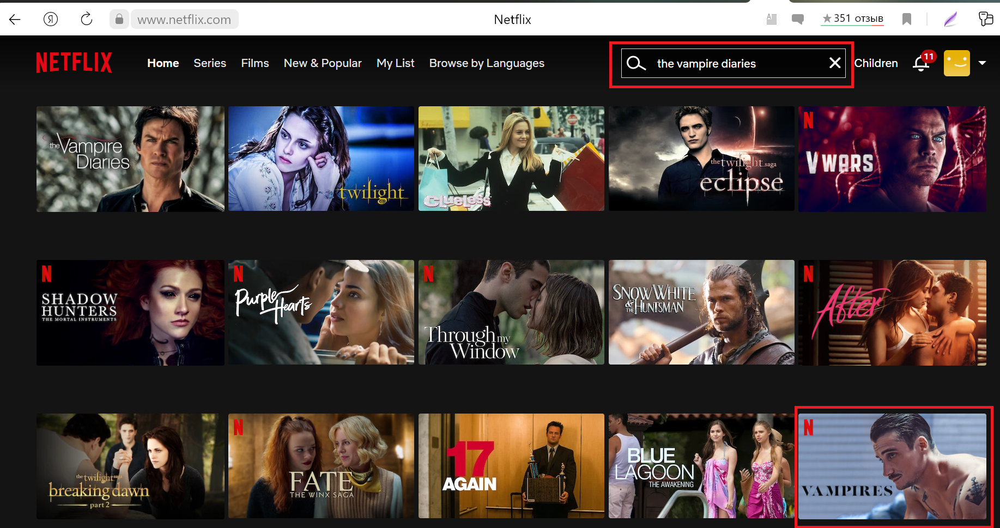

In [68]:
Image("TVD.png", width=800, height=800)

**Kung Fu Panda:**

***Singe metric***
- 7347                                    Love on Delivery
- 8303                                     The Five Venoms
- 5857                Kung Fu Panda: Secrets of the Scroll
- 5864    Crouching Tiger, Hidden Dragon: Sword of Destiny
- 6464                         Chhota Bheem Kungfu Dhamaka
- 574                                      Kung Fu Panda 2
- 3056                 Chhota Bheem Kung Fu Dhamaka Series
- 423                      Chhota Bheem: Master of Shaolin
- 295                                     The Paper Tigers
- 7390                                      Man of Tai Chi    
 
***Multile metrics***
- 7241                             Kung Fu Panda: Holiday
- 574                                     Kung Fu Panda 2
- 5857               Kung Fu Panda: Secrets of the Scroll
- 3691           DreamWorks Kung Fu Panda Awesome Secrets
- 2778                      Bethany Hamilton: Unstoppable
- 5273                             Ghost of the Mountains
- 6406    Calico Critters: The Treasure of Calico Village
- 8162                                      Tellur Aliens
- 755                       Kitty Love: An Homage to Cats
- 938                     Motu Patlu in the Game of Zones

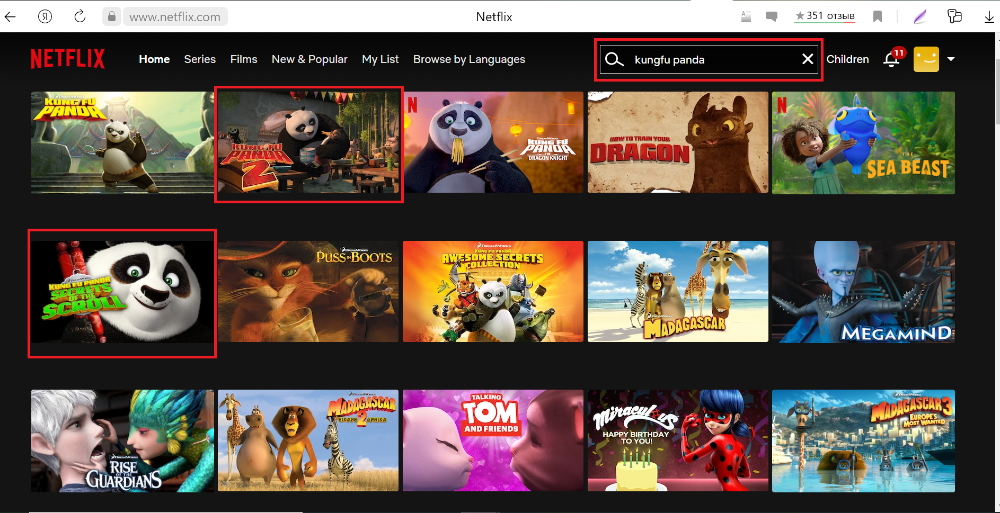

In [69]:
Image("KFP.png", width=800, height=800)

**Twilight:**

***Singe metric***
- 450                  The Twilight Saga: New Moon
- 449                   The Twilight Saga: Eclipse
- 447     The Twilight Saga: Breaking Dawn: Part 1
- 448     The Twilight Saga: Breaking Dawn: Part 2
- 2744                          The Little Vampire
- 5259                                   Satu Hari
- 2797                                    Vampires
- 8420                  The Men Who Stare at Goats
- 3316                      Bella and the Bulldogs
- 4032                                   Immortals   
 
***Multile metrics***
- 447     The Twilight Saga: Breaking Dawn: Part 1
- 449                   The Twilight Saga: Eclipse
- 448     The Twilight Saga: Breaking Dawn: Part 2
- 450                  The Twilight Saga: New Moon
- 4782       The Legacy of a Whitetail Deer Hunter
- 6326                            Black Site Delta
- 2713                                 Sol Levante
- 6077                                   Abdo Mota
- 6429                             Casino Tycoon 2
- 2451                                       Mirai

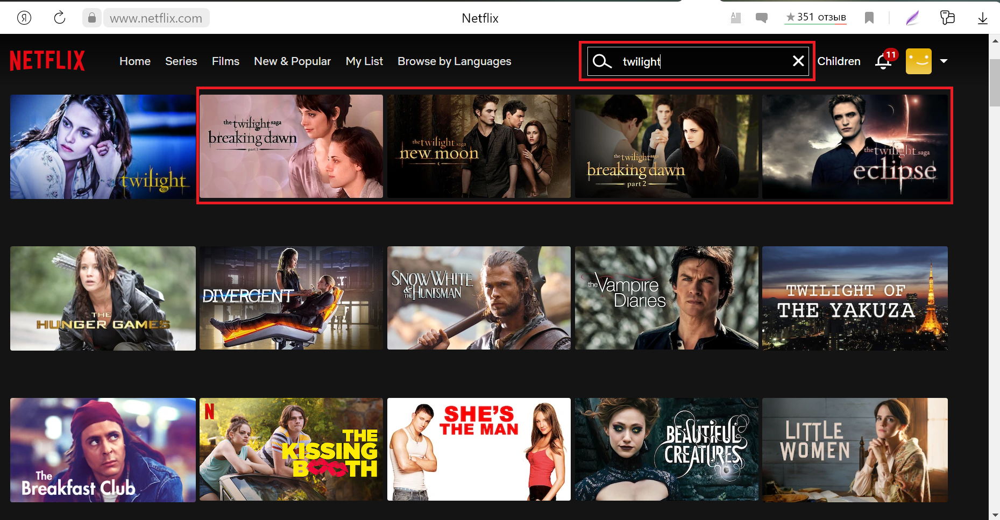

In [70]:
Image("TWL.png", width=800, height=800)

In order to justify modelling I compared the results with the Netflix recommendation from my account. It's glad to see that some of them are the same.

# Task 2 - Market Basket Analysis

**Market Basket Analysis** is one of the key techniques used by large retailers to uncover associations between items. It works by looking for combinations of items that occur together frequently in transactions. To put it another way, it allows retailers to identify relationships between the items that people buy.

In Retail, Market Basket Analysis can help determine what items are purchased together, purchased sequentially, and purchased by season. This can assist retailers to determine product placement and promotion optimization (for instance, combining product incentives).

In the era of data science and machine learning, various machine learning concepts are used to make things easier and profitable. When it comes to marketing strategies it becomes very important to learn the behaviour of different customers regarding different products and services. It can be any kind of product or service the provider needs to satisfy the customers to make more and more profits. Machine learning algorithms are now capable of making inferences about consumer behaviour. Using these inferences a provider can indirectly influence any customer to buy more than he wants (Verma). 

## Apriori VS FP-Growth

**Apriori** is a Join-Based algorithm and **FP-Growth** is a Pattern Growth algorithm for frequent itemset mining or frequent pattern mining for market basket analysis.

In [71]:
Image(url= "https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs10462-018-9629-z/MediaObjects/10462_2018_9629_Fig12_HTML.gif?as=webp", width=600, height=400)

One of the most important features of any frequent itemset mining algorithm is that it should take lower timing and memory. Taking this into consideration, we have a lot of algorithms related to FIM algorithms. These two Apriori and FP-Growth algorithms are the most basic FIM algorithms. Other algorithms in this field are improvements of these algorithms. There are some basic differences between these algorithms:

- Apriori generates the frequent patterns by making the itemsets using pairing such as single item set, double itemset, triple itemset.
FP Growth generates an FP-Tree for making frequent patterns.

- Apriori uses candidate generation where frequent subsets are extended one item at a time.
FP-growth generates conditional FP-Tree for every item in the data.

- Since apriori scans the database in each of its steps it becomes time-consuming for data where the number of items is larger.
FP-tree requires only one scan of the database in its beginning steps so it consumes less time.

- Apriori A converted version of the database is saved in the memory.
FP-Growth set of conditional FP-tree for every item is saved in the memory

- Apriori uses breadth-first search.
FP Growth uses a depth-first search.

## Data Understanding and Preparation

In [72]:
data = pd.read_csv("Groceries data.csv")

In [73]:
data.head(-5)

,Member_number,Date,itemDescription,year,month,day,day_of_week
0,1808,2015-07-21,tropical fruit,2015,7,21,1
1,2552,2015-05-01,whole milk,2015,5,1,4
2,2300,2015-09-19,pip fruit,2015,9,19,5
3,1187,2015-12-12,other vegetables,2015,12,12,5
4,3037,2015-01-02,whole milk,2015,1,2,4
...,...,...,...,...,...,...,...
38755,4586,2014-09-26,bottled water,2014,9,26,4
38756,1987,2014-10-29,fruit/vegetable juice,2014,10,29,2
38757,4376,2014-07-12,rolls/buns,2014,7,12,5
38758,2511,2014-06-18,long life bakery product,2014,6,18,2


In [74]:
bskt = pd.read_csv("basket.csv")

In [75]:
bskt.head(-5)

,0,1,2,3,4,5,6,7,8,9,10
0,whole milk,pastry,salty snack,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,sausage,whole milk,semi-finished bread,yogurt,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,soda,pickled vegetables,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,canned beer,misc. beverages,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,sausage,hygiene articles,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
14953,rolls/buns,curd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14954,other vegetables,detergent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14955,semi-finished bread,newspapers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14956,tropical fruit,berries,other vegetables,yogurt,kitchen towels,napkins,NaN,NaN,NaN,NaN,NaN


In [76]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38765 entries, 0 to 38764
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Member_number    38765 non-null  int64 
 1   Date             38765 non-null  object
 2   itemDescription  38765 non-null  object
 3   year             38765 non-null  int64 
 4   month            38765 non-null  int64 
 5   day              38765 non-null  int64 
 6   day_of_week      38765 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 2.1+ MB


In [77]:
len(data['Member_number'].unique())

3898

In [78]:
len(data['itemDescription'].unique())

167

In [79]:
data['itemDescription'].value_counts()

whole milk               2502
other vegetables         1898
rolls/buns               1716
soda                     1514
yogurt                   1334
                         ... 
rubbing alcohol             5
bags                        4
baby cosmetics              3
kitchen utensil             1
preservation products       1
Name: itemDescription, Length: 167, dtype: int64

In [80]:
freq_items = data['itemDescription'].value_counts()

In [81]:
fig = px.bar(data_frame=freq_items.head(30), title='Top 30 Items', color=freq_items.head(30), color_continuous_scale = "darkmint",
                 labels={
                     "index": "Items",
                     "values": "Quantity",
                     'lift': 'Lift'
                 })
fig.update_layout(title_x=0.5, title_y=0.86)
fig.show()

In [82]:
user_id = data['Member_number'].unique()
items = [list(data.loc[data['Member_number'] == id, 'itemDescription']) for id in user_id]
print(items[1])

['whole milk', 'butter', 'female sanitary products', 'pot plants', 'other vegetables', 'tropical fruit', 'root vegetables', 'whole milk', 'shopping bags', 'chocolate', 'chocolate', 'coffee', 'hygiene articles']


## Apriori

The most frequent approach is to apply the Apriori algorithm, which starts out by generating the frequent itemsets for your data with a minimum number of items k, which you can set. It decides which itemsets are frequent by requiring them to meet a minimum level of support (explained above). Then, those frequent itemsets are partitioned (divided) and re-combined repetitively and the support calculated for each combination, until no more itemsets can be created.

Association rules are generated from the frequent itemsets by splitting them apart into antecedents and consequents, and then the confidence for each rule is calculated. Only the association rules that meet a minimum confidence level will be retained, and the others are discarded (Ph.D, 2020).

In [83]:
TE = TransactionEncoder()
TE.fit(items)
item_transformed = TE.transform(items)
item_matrix = pd.DataFrame(item_transformed, columns = TE.columns_)
item_matrix.head()

,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,beverages,bottled beer,bottled water,brandy,brown bread,butter,butter milk,cake bar,candles,candy,canned beer,canned fish,canned fruit,canned vegetables,cat food,...,sparkling wine,specialty bar,specialty cheese,specialty chocolate,specialty fat,specialty vegetables,spices,spread cheese,sugar,sweet spreads,syrup,tea,tidbits,toilet cleaner,tropical fruit,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False


In [84]:
freq_items = apriori(item_matrix, min_support=0.03, use_colnames=True, max_len=2)
freq_items.sort_values(by = "support", ascending = False)

,support,itemsets
70,0.458184,(whole milk)
44,0.376603,(other vegetables)
53,0.349666,(rolls/buns)
60,0.313494,(soda)
71,0.282966,(yogurt)
...,...,...
239,0.030015,"(shopping bags, newspapers)"
116,0.030015,"(brown bread, canned beer)"
180,0.030015,"(curd, root vegetables)"
176,0.030015,"(cream cheese , soda)"


As you can see, this metric provides a different and perhaps more useful insight into the nature of customers’ behavior; we are getting not just frequency, but also a measure of likelihood.

In [85]:
rules = association_rules(freq_items, metric = "confidence", min_threshold = 0.0)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(other vegetables),(UHT-milk),0.376603,0.078502,0.038994,0.103542,1.318979,0.009430,1.027933
1,(UHT-milk),(other vegetables),0.078502,0.376603,0.038994,0.496732,1.318979,0.009430,1.238697
2,(rolls/buns),(UHT-milk),0.349666,0.078502,0.031042,0.088775,1.130863,0.003592,1.011274
3,(UHT-milk),(rolls/buns),0.078502,0.349666,0.031042,0.395425,1.130863,0.003592,1.075687
4,(whole milk),(UHT-milk),0.458184,0.078502,0.040534,0.088466,1.126928,0.004565,1.010931
...,...,...,...,...,...,...,...,...,...
507,(yogurt),(whipped/sour cream),0.282966,0.154695,0.047973,0.169538,1.095950,0.004200,1.017873
508,(white bread),(whole milk),0.088763,0.458184,0.047717,0.537572,1.173268,0.007047,1.171678
509,(whole milk),(white bread),0.458184,0.088763,0.047717,0.104143,1.173268,0.007047,1.017168
510,(whole milk),(yogurt),0.458184,0.282966,0.150590,0.328667,1.161510,0.020940,1.068076


In [86]:
rules_eda = rules.copy(deep=True)
rules_support_eda = rules_eda['support'] >= rules_eda['support'].quantile(q = 0.8)
rules_confi_eda = rules_eda['confidence'] >= rules_eda['confidence'].quantile(q = 0.8)
rules_lift_eda = rules_eda['lift'] > 1
rules_best_eda = rules_eda[rules_support_eda & rules_confi_eda & rules_lift_eda]
rules_best_eda.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
27,(bottled beer),(other vegetables),0.158799,0.376603,0.068497,0.431341,1.145345,0.008692,1.096257
45,(bottled beer),(whole milk),0.158799,0.458184,0.085428,0.537964,1.174124,0.012669,1.172672
65,(bottled water),(other vegetables),0.213699,0.376603,0.093894,0.439376,1.166680,0.013414,1.111969
84,(bottled water),(whole milk),0.213699,0.458184,0.112365,0.525810,1.147597,0.014452,1.142615
106,(brown bread),(whole milk),0.135967,0.458184,0.069779,0.513208,1.120091,0.007481,1.113034


In [87]:
rules_best_eda['antecedents'] = rules_best_eda['antecedents'].apply(lambda a: ', '.join(list(a)))
rules_best_eda['consequents'] = rules_best_eda['consequents'].apply(lambda a: ', '.join(list(a)))
rules_best_eda.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
27,bottled beer,other vegetables,0.158799,0.376603,0.068497,0.431341,1.145345,0.008692,1.096257
45,bottled beer,whole milk,0.158799,0.458184,0.085428,0.537964,1.174124,0.012669,1.172672
65,bottled water,other vegetables,0.213699,0.376603,0.093894,0.439376,1.166680,0.013414,1.111969
84,bottled water,whole milk,0.213699,0.458184,0.112365,0.525810,1.147597,0.014452,1.142615
106,brown bread,whole milk,0.135967,0.458184,0.069779,0.513208,1.120091,0.007481,1.113034


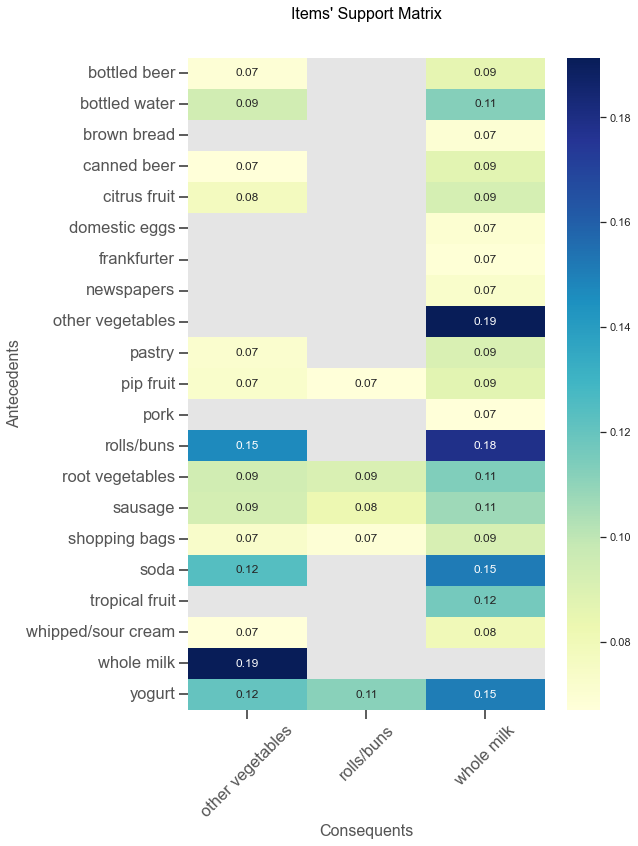

In [88]:
pivot_support = rules_best_eda.pivot(index='antecedents', columns='consequents', values='support')

sns.set_context("talk")
plt.style.use('ggplot')
plt.subplots(figsize=(8, 12))
sns.set()
ax = sns.heatmap(data=pivot_support, annot=True, fmt='.2f', cmap='YlGnBu', cbar=True)
plt.title("Items' Support Matrix", fontsize=16, y=1.05)
ax.set_xlabel("Consequents",fontsize=16)
ax.set_ylabel("Antecedents",fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show() 

In [89]:
pivot_confidence = rules_best_eda.pivot(index='antecedents', columns='consequents', values='confidence')

fig = ff.create_annotated_heatmap(pivot_confidence.to_numpy().round(2), 
                                  x=list(pivot_confidence.columns), 
                                  y=list(pivot_confidence.index), 
                                  colorscale=['grey', 'orange', 'red'], 
                                  font_colors=['white', 'white', 'white'])
fig.update_layout(
    template='simple_white',
    autosize=False,
    width=800,
    height=800,
    title="Lift Matrix",
    xaxis_title='Consequents',
    yaxis_title='Antecedents',
    legend_title="Legend Title",
    font=dict(
        family="Caliber",
        size=14,
        color="Black"
    )
)
fig.update_layout(title_x=0.22, title_y=0.98)
fig.update_traces(showscale=True)
fig.show()

In [90]:
network_A = list(rules_best_eda["antecedents"].unique())
network_B = list(rules_best_eda["consequents"].unique())
node_list = list(set(network_A+network_B))
G = nx.Graph()
for i in node_list:
    G.add_node(i)
for i,j in rules_best_eda.iterrows():
    G.add_edges_from([(j["antecedents"],j["consequents"])])
pos = nx.spring_layout(G, k=0.5, dim=2, iterations=400)
for n, p in pos.items():
    G.nodes[n]['pos'] = p

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])

node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=15,
        colorbar=dict(
            thickness=10,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0)))
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])

for node, adjacencies in enumerate(G.adjacency()):
    node_trace['marker']['color']+=tuple([len(adjacencies[1])])
    node_info = str(adjacencies[0]) +' has {} connections'.format(str(len(adjacencies[1])))
    node_trace['text']+=tuple([node_info])

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='Connection of Top 20 Percentile Items',
                titlefont=dict(size=16),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
fig.update_layout(title_x=0.5, title_y=0.96)
iplot(fig)

In [91]:
rules_fix = rules.copy(deep=True)
rules_fix['antecedents'] = rules_fix['antecedents'].apply(lambda a: ', '.join(list(a)))
rules_fix['consequents'] = rules_fix['consequents'].apply(lambda a: ', '.join(list(a)))

In [92]:
fig = px.scatter(rules_fix, x='support', y='confidence', 
                 color='lift', hover_data=['antecedents', 'confidence'],
                 labels={
                     "support": "Support",
                     "confidence": "Confidence",
                     'lift': 'Lift'
                 },
                title="Support v.s. Confidence")
fig.update_layout(title_x=0.5, title_y=0.86)
fig.show()

In [93]:
network_A = list(rules_fix["antecedents"].unique())
network_B = list(rules_fix["consequents"].unique())
node_list = list(set(network_A+network_B))
G = nx.Graph()
for i in node_list:
    G.add_node(i)
for i,j in rules_fix.iterrows():
    G.add_edges_from([(j["antecedents"],j["consequents"])])
pos = nx.spring_layout(G, k=0.5, dim=2, iterations=400)
for n, p in pos.items():
    G.nodes[n]['pos'] = p

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])

node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='electric',
        reversescale=False,
        color=[],
        size=8,
        colorbar=dict(
            thickness=10,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0)))
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])

for node, adjacencies in enumerate(G.adjacency()):
    node_trace['marker']['color']+=tuple([len(adjacencies[1])])
    node_info = str(adjacencies[0]) +' has {} connections'.format(str(len(adjacencies[1])))
    node_trace['text']+=tuple([node_info])

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='All Item Network Apriori',
                titlefont=dict(size=16),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
fig.update_layout(title_x=0.5, title_y=0.96)
iplot(fig)

### Milk item Analyze

Relating the **"whole mike" has the highest support (45.82%)**, I'm going to choose it first as the item for the basket analysis. The results are sorted by "confidence", because it's basically the probability that a product from **"consequents"** is purchased given the purchase of "whole milk".

In [94]:
rules_sel_m = rules[rules["antecedents"].apply(lambda x: "whole milk" in x)]
rules_sel_m.sort_values('confidence', ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
377,(whole milk),(other vegetables),0.458184,0.376603,0.191380,0.417693,1.109106,0.018827,1.070564
445,(whole milk),(rolls/buns),0.458184,0.349666,0.178553,0.389698,1.114484,0.018342,1.065592
490,(whole milk),(soda),0.458184,0.313494,0.151103,0.329787,1.051973,0.007465,1.024310
510,(whole milk),(yogurt),0.458184,0.282966,0.150590,0.328667,1.161510,0.020940,1.068076
499,(whole milk),(tropical fruit),0.458184,0.233710,0.116470,0.254199,1.087672,0.009388,1.027473
459,(whole milk),(root vegetables),0.458184,0.230631,0.113135,0.246920,1.070630,0.007464,1.021630
85,(whole milk),(bottled water),0.458184,0.213699,0.112365,0.245241,1.147597,0.014452,1.041790
473,(whole milk),(sausage),0.458184,0.206003,0.106978,0.233483,1.133394,0.012591,1.035850
189,(whole milk),(citrus fruit),0.458184,0.185480,0.092355,0.201568,1.086737,0.007371,1.020150
481,(whole milk),(shopping bags),0.458184,0.168291,0.091329,0.199328,1.184422,0.014220,1.038763


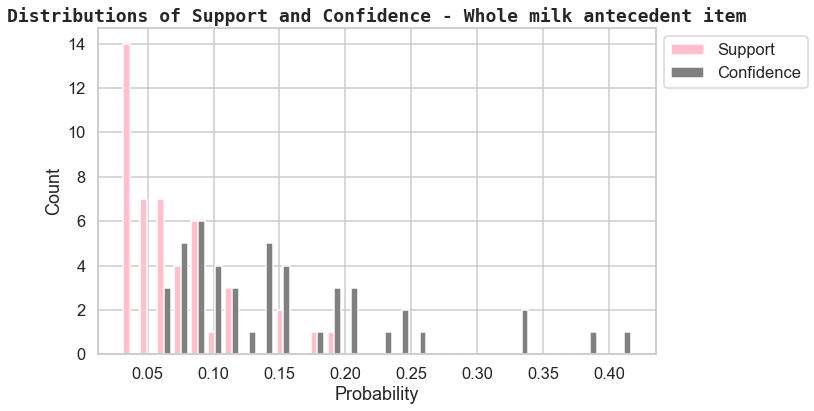

In [95]:
sns.set_context('talk')
sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))
plt.hist([rules_sel_m["support"], rules_sel_m["confidence"]], bins=30, label=['Support', 'Confidence'], color=['pink', 'gray'])

plt.xlabel("Probability")
plt.ylabel("Count")

plt.title("Distributions of Support and Confidence - Whole milk antecedent item",
         fontsize='medium',
          fontweight='bold',
          family='monospace')

plt.legend(bbox_to_anchor=(1.0, 1), loc='upper left')

plt.show()

Next I want to find the most important items that customers would buy after purchasing "whole milk".
I'm using next rules for the filtering:

- support >= quatille = 0.9
the highest values of support, which are contain in support distribution from 90% to 100%.
- confidence >= quantille = 0.9
the highest values of confidence, which are contain in confidence distribution from 90% to 100%.
- lift>1
a value of lift other than 1 means that some dependency exists between the items.

For all these rules above I will use "&" logic funtion to get the result.

In [96]:
rules_support_m = rules_sel_m['support'] >= rules_sel_m['support'].quantile(q = 0.9)
rules_confi_m = rules_sel_m['confidence'] >= rules_sel_m['confidence'].quantile(q = 0.9)
rules_lift_m = rules_sel_m['lift'] > 1
rules_best_m = rules_sel_m[rules_support_m & rules_confi_m & rules_lift_m]
rules_best_m

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
377,(whole milk),(other vegetables),0.458184,0.376603,0.191380,0.417693,1.109106,0.018827,1.070564
445,(whole milk),(rolls/buns),0.458184,0.349666,0.178553,0.389698,1.114484,0.018342,1.065592
490,(whole milk),(soda),0.458184,0.313494,0.151103,0.329787,1.051973,0.007465,1.024310
499,(whole milk),(tropical fruit),0.458184,0.233710,0.116470,0.254199,1.087672,0.009388,1.027473
510,(whole milk),(yogurt),0.458184,0.282966,0.150590,0.328667,1.161510,0.020940,1.068076


In [97]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['lift'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_m['support'], y=rules_best_m['lift'], name='Top Consequents Whole milk item', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Lift",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='Contribution of The Top Items', title_x=0.5, title_y=0.86)
fig.show()

In [98]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['confidence'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_m['support'], y=rules_best_m['confidence'], name='Top Consequents Whole milk item', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Confidence",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='Contribution of The Top Items', title_x=0.5, title_y=0.86)
fig.show()

In [99]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['conviction'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_m['support'], y=rules_best_m['conviction'], name='Top Consequents Whole milk', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Conviction",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='Contribution of The Top Items', title_x=0.5, title_y=0.86)
fig.show()

### Other vegetables item Analyze

In [100]:
rules_sel_v = rules[rules["antecedents"].apply(lambda x: "other vegetables" in x)]
rules_sel_v.sort_values('confidence', ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
376,(other vegetables),(whole milk),0.376603,0.458184,0.191380,0.508174,1.109106,0.018827,1.101643
358,(other vegetables),(rolls/buns),0.376603,0.349666,0.146742,0.389646,1.114335,0.015056,1.065502
366,(other vegetables),(soda),0.376603,0.313494,0.124166,0.329700,1.051695,0.006103,1.024178
378,(other vegetables),(yogurt),0.376603,0.282966,0.120318,0.319482,1.129050,0.013752,1.053660
361,(other vegetables),(root vegetables),0.376603,0.230631,0.094151,0.250000,1.083982,0.007294,1.025825
64,(other vegetables),(bottled water),0.376603,0.213699,0.093894,0.249319,1.166680,0.013414,1.047450
363,(other vegetables),(sausage),0.376603,0.206003,0.092868,0.246594,1.197040,0.015287,1.053877
369,(other vegetables),(tropical fruit),0.376603,0.233710,0.091329,0.242507,1.037642,0.003313,1.011614
170,(other vegetables),(citrus fruit),0.376603,0.185480,0.077476,0.205722,1.109135,0.007623,1.025485
364,(other vegetables),(shopping bags),0.376603,0.168291,0.073114,0.194142,1.153604,0.009735,1.032078


In [101]:
rules_support_v = rules_sel_v['support'] >= rules_sel_v['support'].quantile(q = 0.9)
rules_confi_v = rules_sel_v['confidence'] >= rules_sel_v['confidence'].quantile(q = 0.9)
rules_lift_v = rules_sel_v['lift'] > 1
rules_best_v = rules_sel_v[rules_support_v & rules_confi_v & rules_lift_v]
rules_best_v

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
358,(other vegetables),(rolls/buns),0.376603,0.349666,0.146742,0.389646,1.114335,0.015056,1.065502
366,(other vegetables),(soda),0.376603,0.313494,0.124166,0.329700,1.051695,0.006103,1.024178
376,(other vegetables),(whole milk),0.376603,0.458184,0.191380,0.508174,1.109106,0.018827,1.101643
378,(other vegetables),(yogurt),0.376603,0.282966,0.120318,0.319482,1.129050,0.013752,1.053660


In [102]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['confidence'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_v['support'], y=rules_best_v['confidence'], name='Top Consequents Other Vegetables', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Confidence",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='Top All and Other Vegetables Items', title_x=0.5, title_y=0.86)
fig.show()

It's interesting to see that the line "ray" joined the top Consequents Vegetable Items lie upper than the top Whole Milk. I think the "ray" of the top Soda item will be higher than Whole Milk and Other Vegetables.

In [103]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['lift'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_v['support'], y=rules_best_v['lift'], name='Top Other Vegetables', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Lift",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='Top All and Soda Items', title_x=0.5, title_y=0.86)
fig.show()

In [104]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['conviction'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_v['support'], y=rules_best_v['conviction'], name='Top Consequents Other Vegetables', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Conviction",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='The Top All and Other Vegetables Items', title_x=0.5, title_y=0.86)
fig.show()

### Soda item Analyze

In [105]:
rules_sel_s = rules[rules["antecedents"].apply(lambda x: "soda" in x)]
rules_sel_s.sort_values('confidence', ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
491,(soda),(whole milk),0.313494,0.458184,0.151103,0.481997,1.051973,0.007465,1.045971
367,(soda),(other vegetables),0.313494,0.376603,0.124166,0.396072,1.051695,0.006103,1.032237
437,(soda),(rolls/buns),0.313494,0.349666,0.119805,0.382160,1.092928,0.010187,1.052593
493,(soda),(yogurt),0.313494,0.282966,0.097486,0.310966,1.098952,0.008778,1.040637
485,(soda),(tropical fruit),0.313494,0.233710,0.081837,0.261047,1.116974,0.008570,1.036995
453,(soda),(root vegetables),0.313494,0.230631,0.081324,0.259411,1.124787,0.009022,1.038861
467,(soda),(sausage),0.313494,0.206003,0.077219,0.246318,1.195698,0.012638,1.053490
79,(soda),(bottled water),0.313494,0.213699,0.076193,0.243044,1.137318,0.009199,1.038767
185,(soda),(citrus fruit),0.313494,0.185480,0.065162,0.207856,1.120640,0.007015,1.028248
477,(soda),(shopping bags),0.313494,0.168291,0.064649,0.206219,1.225370,0.011890,1.047781


In [106]:
rules_support_s = rules_sel_s['support'] >= rules_sel_s['support'].quantile(q = 0.9)
rules_confi_s = rules_sel_s['confidence'] >= rules_sel_s['confidence'].quantile(q = 0.9)
rules_lift_s = rules_sel_s['lift'] > 1
rules_best_s = rules_sel_s[rules_support_s & rules_confi_s & rules_lift_s]
rules_best_s

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
367,(soda),(other vegetables),0.313494,0.376603,0.124166,0.396072,1.051695,0.006103,1.032237
437,(soda),(rolls/buns),0.313494,0.349666,0.119805,0.382160,1.092928,0.010187,1.052593
491,(soda),(whole milk),0.313494,0.458184,0.151103,0.481997,1.051973,0.007465,1.045971


In [107]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['confidence'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_s['support'], y=rules_best_s['confidence'], name='Top Consequents Soda item', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Confidence",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='Top All and Soda Items', title_x=0.5, title_y=0.86)
fig.show()

In [108]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['lift'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_s['support'], y=rules_best_s['lift'], name='Top Consequents Soda item', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Lift",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='The Top All and Soda Items', title_x=0.5, title_y=0.86)
fig.show()

In [109]:
fig=go.Figure()
fig.add_trace(
    go.Scatter(x=rules_fix['support'], y=rules_fix['conviction'], name='All Combinations', mode='markers', opacity=0.3)
)
fig.add_trace(
    go.Scatter(x=rules_best_s['support'], y=rules_best_s['conviction'], name='Top Consequents Soda', mode='markers')
)

fig.update_xaxes(
        title_text = "Support",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_yaxes(
        title_text = "Conviction",
        title_font = {"size": 16},
        title_standoff = 12)
fig.update_layout(title='The Top All and Soda Items', title_x=0.5, title_y=0.86)
fig.show()

## FP growth

The FP-Growth algorithm, the algorithm represents the data in a tree structure. It is a lexicographic tree structure that we call the FP-tree. Which is responsible for maintaining the association information between the frequent items. 

In [110]:
freq_items_fpg = fpgrowth(item_matrix, min_support=0.03, use_colnames=True, max_len=2)
freq_items_fpg.sort_values(by = "support", ascending = False)

,support,itemsets
0,0.458184,(whole milk)
10,0.376603,(other vegetables)
1,0.349666,(rolls/buns)
24,0.313494,(soda)
29,0.282966,(yogurt)
...,...,...
153,0.030015,"(pastry, frankfurter)"
302,0.030015,"(cream cheese , soda)"
234,0.030015,"(shopping bags, newspapers)"
257,0.030015,"(brown bread, canned beer)"


In [111]:
rules_fpg = association_rules(freq_items_fpg, metric = "confidence", min_threshold = 0.0)
rules_fpg

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(rolls/buns),(whole milk),0.349666,0.458184,0.178553,0.510638,1.114484,0.018342,1.107190
1,(whole milk),(rolls/buns),0.458184,0.349666,0.178553,0.389698,1.114484,0.018342,1.065592
2,(other vegetables),(rolls/buns),0.376603,0.349666,0.146742,0.389646,1.114335,0.015056,1.065502
3,(rolls/buns),(other vegetables),0.349666,0.376603,0.146742,0.419663,1.114335,0.015056,1.074197
4,(tropical fruit),(whole milk),0.233710,0.458184,0.116470,0.498353,1.087672,0.009388,1.080076
...,...,...,...,...,...,...,...,...,...
507,(UHT-milk),(rolls/buns),0.078502,0.349666,0.031042,0.395425,1.130863,0.003592,1.075687
508,(frozen meals),(whole milk),0.062853,0.458184,0.032581,0.518367,1.131353,0.003783,1.124958
509,(whole milk),(frozen meals),0.458184,0.062853,0.032581,0.071109,1.131353,0.003783,1.008888
510,(ice cream),(whole milk),0.056439,0.458184,0.030272,0.536364,1.170630,0.004412,1.168623


In [112]:
rules_fix_fpg = rules_fpg.copy(deep=True)
rules_fix_fpg['antecedents'] = rules_fix_fpg['antecedents'].apply(lambda a: ', '.join(list(a)))
rules_fix_fpg['consequents'] = rules_fix_fpg['consequents'].apply(lambda a: ', '.join(list(a)))

In [113]:
network_A = list(rules_fix_fpg["antecedents"].unique())
network_B = list(rules_fix_fpg["consequents"].unique())
node_list = list(set(network_A+network_B))
G = nx.Graph()
for i in node_list:
    G.add_node(i)
for i,j in rules_fix_fpg.iterrows():
    G.add_edges_from([(j["antecedents"],j["consequents"])])
pos = nx.spring_layout(G, k=0.5, dim=2, iterations=400)
for n, p in pos.items():
    G.nodes[n]['pos'] = p

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])

node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='electric',
        reversescale=False,
        color=[],
        size=8,
        colorbar=dict(
            thickness=10,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0)))
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])

for node, adjacencies in enumerate(G.adjacency()):
    node_trace['marker']['color']+=tuple([len(adjacencies[1])])
    node_info = str(adjacencies[0]) +' has {} connections'.format(str(len(adjacencies[1])))
    node_trace['text']+=tuple([node_info])

fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='All Item Network FP Growth',
                titlefont=dict(size=16),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
fig.update_layout(title_x=0.5, title_y=0.96)
iplot(fig)

It could be seen that results of Apriopri and FP Growth Algoriths are the same.

# Task 3 - Dashboard

For my Dashboar I'm going to use `dash` library. **Dash** is a python framework created by plotly for creating interactive web applications.

Dash applications are made up of 2 building blocks :

- Layout
- Callbacks

Layout describes the look and feel of the app, it defines the elements such as graphs, dropdowns etc and the placement, size, color etc of these elements. Dash contains Dash HTML components using which we can create and style HTML content such as headings, paragraph, images etc using python. Elements such as graphs, dropdowns, sliders are created using Dash Core components.

Callbacks are used to bring interactivity to the dash applications. These are the functions using which, for example, we can define the activity that would happen on clicking a button or a dropdown (Tomar, 2021).



## Layot

In [114]:
dashboard = dash.Dash(__name__, title="Netflix Dashboard ")

Before applying `layout` for Dash I want to define some functions.

The "Top 10 countries Movie & TV Show split" analyses from 1.2.3.7 part.

In [115]:
def fig_bar_horiz():
    country_order = data_net['country_main'].value_counts()[:11].index
    data_q2q3 = data_net[['type', 'country_main']].groupby('country_main')['type'].value_counts().unstack().loc[
        country_order]
    data_q2q3['sum'] = data_q2q3.sum(axis=1)
    data_q2q3_ratio = (data_q2q3.T / data_q2q3['sum']).T[['Movie', 'TV Show']].sort_values(by='Movie', ascending=False)[
                      ::-1]
    fig_bar = go.Figure()
    fig_bar.add_trace(go.Bar(
        y=data_q2q3_ratio.index,
        x=round(data_q2q3_ratio['Movie'] * 100, 2),
        name='Movies',
        orientation='h',

        marker=dict(
            color='#b20710',
            line=dict( width=3),
        )
    ))
    fig_bar.add_trace(go.Bar(
        y=data_q2q3_ratio.index,
        x=round(data_q2q3_ratio['TV Show'] * 100, 2),
        name='TV Shows',
        orientation='h',
        marker=dict(
            color='#221f1f',
            line=dict(width=3)
        )
    ))

    fig_bar.update_layout(barmode='stack',
                          title={
                              'text': "Top 10 countries Movie & TV Show split",
                              'y': 0.9,
                              'x': 0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'}
                          )
    return fig_bar

The "Rating distribution by Movie & TV Show" analyses from 1.2.3.4 part.

In [116]:
def fig_bar_stacked():
    order = pd.DataFrame(data_net.groupby('rating')['count'].sum().sort_values(ascending=False).reset_index())
    rating_order = list(order['rating'])
    mf = data_net.groupby('type')['rating'].value_counts().unstack().sort_index().fillna(0).astype(int)[rating_order]

    movie = mf.loc['Movie']
    tv = - mf.loc['TV Show']

    fig_stacked = go.Figure()
    fig_stacked.add_trace(go.Bar(x=movie.index, y=movie, name='Movies',marker_color='#b20710'))
    fig_stacked.add_trace(go.Bar(x=tv.index, y=tv, name='TVShows',marker_color='#221f1f'))
    fig_stacked.update_layout(barmode='relative',
                              title={
                                      'text': 'Rating distribution by Movie & TV Show',
                                       'y': 0.9,
                                       'x': 0.5,
                                       'xanchor': 'center',
                                       'yanchor': 'top'}
                             )
    return fig_stacked

The "Sentiment Analysis over years for Movies and TV Shows" analyses from 1.2.3.8 part.

In [117]:
def fig_stack_without_flying():
    dfx = data_net[['release_year', 'description']]
    dfx = dfx.rename(columns={'release_year': 'Release Year'})
    for index, row in dfx.iterrows():
        z = row['description']
        testimonial = TextBlob(z)
        p = testimonial.sentiment.polarity
        if p == 0:
            sent = 'Normal'
        elif p > 0:
            sent = 'Positive'
        else:
            sent = 'Negative'
        dfx.loc[[index, 2], 'Sentiment'] = sent

    dfx = dfx.groupby(['Release Year', 'Sentiment']).size().reset_index(name='Total Content')

    dfx = dfx[dfx['Release Year'] >= 2010]
    fig_stacked_without_fly = px.bar(dfx, x="Release Year", y="Total Content",color='Sentiment')
    fig_stacked_without_fly.update_layout(title={
        'text': 'Sentiment Analysis over years for Movies and TV Shows',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
    return fig_stacked_without_fly

Let's apply the `dashboard.layot`.

In [118]:
dashboard.layout = html.Div(children=[

    html.H1(id='header', children=[html.Div("Netflix Movies and TV Shows Analysis", id='header-text')],
            style={'textAlign': 'center', 'color': '#b20710'}, className="mb-3"),
    html.Br(),
    html.Br(),
    html.Br(),
    html.Div(children=[
        html.Div(children=[
            html.P('Filter by Release Year', className='fix_label', style={'text-align': 'center', 'color': '#221f1f'}),
            dcc.Slider(id='slider_year',
                       included=True,
                       updatemode='drag',
                       tooltip={'always_visible': True},
                       min=1925,
                       max=2021,
                       step=1,
                       value=2015,
                       marks={str(yr): str(yr) for yr in range(1925, 2021, 10)}, className="row"
                       ),
            
            html.Div([
                html.Div([
                    dcc.Graph(id='line_chart', config={'displayModeBar': 'hover'}), ], className="row",
                    style={'width': '100%'}),

            ]),
        ], className="col-md-6"),  
        
        
        
               
        html.Div(children=[
            html.Div([
                dcc.Graph(id='bar_fig', figure=fig_bar_horiz())], id='FigBarGraphDiv')
        ], className="col-md-6"),

    ], className="row"),
    
    
    html.Div(children=[
        html.Div(children=[
            html.Div([
                dcc.Graph(id='stack_fig', figure=fig_bar_stacked())], id='StackedGraphDiv')

        ], className="col-md-6"),
        html.Div(children=[
            html.Div([
                dcc.Graph(id='SentBarGraphDiv', figure=fig_stack_without_flying()), ])
        ], className="col-md-6"),

    ], className="row"),


        html.Div(children=[
            html.Label('Movie Statistics', id='calculator'),
            html.Div([
                dcc.Dropdown(id='dropDown', options=[{'label': x, 'value': x} for x in data_net['country_main'].unique()],
                             value='Egypt'),
                html.Br(),
                html.Br(),
                html.Table([
                    html.Tbody([
                        html.Tr([
                            html.Td("No. of Movies till date"),

                            html.Td([
                                html.Div(
                                    id="val1"

                                )

                            ])
                        ]),
                        html.Tr([
                            html.Td("No. of TV Shows till date"),

                            html.Td([
                                html.Div(
                                    id="val2"

                                )

                            ])
                        ]),
                        html.Tr([
                            html.Td("Top Actor"),

                            html.Td([
                                html.Div(
                                    id="val3"

                                )

                            ])
                        ]),
                        html.Tr([
                            html.Td("Top Director"),

                            html.Td([
                                html.Div(
                                    id="val4"

                                )

                            ])
                        ])

                    ])
                ], className="table table-striped")
            ])
        ], className="col-md-6"),

    ], 
className="container-fluid",)

## Callback

In [119]:
@dashboard.callback(
    [Output('val1', 'children'), Output('val2', 'children'), Output('val3', 'children'), Output('val4', 'children')],
    Input('dropDown', 'value')
)
def updateTable(dropDown):
    dfx = data_net[['type', 'country']]
    dfMovie = dfx[dfx['type'] == 'Movie']
    dfTV = dfx[dfx['type'] == 'TV Show']
    dfM1 = dfMovie['country'].str.split(',', expand=True).stack()
    dfTV1 = dfTV['country'].str.split(',', expand=True).stack()
    dfM1 = dfM1.to_frame()
    dfTV1 = dfTV1.to_frame()
    dfM1.columns = ['country']
    dfTV1.columns = ['country']
    dfM2 = dfM1.groupby(['country']).size().reset_index(name='counts')
    dfTV2 = dfTV1.groupby(['country']).size().reset_index(name='counts')
    dfM2['country'] = dfM2['country'].str.strip()
    dfTV2['country'] = dfTV2['country'].str.strip()
    val11 = dfM2[dfM2['country'] == dropDown]
    val22 = dfTV2[dfTV2['country'] == dropDown]
    val11 = val11.reset_index()
    val22 = val22.reset_index()

    if val11.empty:
        val1 = 0
    else:
        val1 = val11.loc[0]['counts']

    if val22.empty:
        val2 = 0
    else:
        val2 = val22.loc[0]['counts']

    # Top Actor
    dfA = data_net[['cast', 'country']]
    dfA1 = dfA[dfA['country'].str.contains(dropDown, case=False)]
    dfA2 = dfA1['cast'].str.split(',', expand=True).stack()
    dfA2 = dfA2.to_frame()
    dfA2.columns = ['Cast']
    dfA3 = dfA2.groupby(['Cast']).size().reset_index(name='counts')
    dfA3 = dfA3[dfA3['Cast'] != 'No Cast Specified']
    dfA3 = dfA3.sort_values(by='counts', ascending=False)
    if dfA3.empty:
        val3 = "Actor data from this country is not available"
    else:
        val3 = dfA3.iloc[0]['Cast']
    # Top Director
    dfD = data_net[['director', 'country']]
    dfD1 = dfD[dfD['country'].str.contains(dropDown, case=False)]
    dfD2 = dfD1['director'].str.split(',', expand=True).stack()
    dfD2 = dfD2.to_frame()
    dfD2.columns = ['Director']
    dfD3 = dfD2.groupby(['Director']).size().reset_index(name='counts')
    dfD3 = dfD3[dfD3['Director'] != 'No Director Specified']
    dfD3 = dfD3.sort_values(by='counts', ascending=False)
    if dfD3.empty:
        val4 = "Director data from this country is not available"
    else:
        val4 = dfD3.iloc[0]['Director']
    return val1, val2, val3, val4

In [120]:
@dashboard.callback(Output('line_chart', 'figure'),
              [Input('slider_year', 'value')])
def update_graph(slider_year):
    type_movie = data_net[(data_net['type'] == 'Movie')][['type', 'release_year']]
    type_movie['type1'] = type_movie['type']
    type_movie_1 = type_movie.groupby(['release_year', 'type1'])['type'].count().reset_index()
    filter_movie = type_movie_1[(type_movie_1['release_year'] >= slider_year)]

    type_tvshow = data_net[(data_net['type'] == 'TV Show')][['type', 'release_year']]
    type_tvshow['type2'] = type_tvshow['type']
    type_tvshow_1 = type_tvshow.groupby(['release_year', 'type2'])['type'].count().reset_index()
    filter_tvshow = type_tvshow_1[(type_tvshow_1['release_year'] >= slider_year)]

    return {
        'data': [go.Scatter(
            x=filter_movie['release_year'],
            y=filter_movie['type'],
            mode='markers+lines',
            name='Movie',
            line=dict(shape="spline", smoothing=1.3, width=3, color='#b20710'),
            marker=dict(size=10, symbol='circle', color='#f5f5f1',
                        line=dict(color='blue', width=2)
                        ),

            hoverinfo='text',
            hovertext=
            '<b>Release Year</b>: ' + filter_movie['release_year'].astype(str) + '<br>' +
            '<b>Type</b>: ' + filter_movie['type1'].astype(str) + '<br>' +
            '<b>Count</b>: ' + [f'{x:,.0f}' for x in filter_movie['type']] + '<br>'
        ),

            go.Scatter(
                x=filter_tvshow['release_year'],
                y=filter_tvshow['type'],
                mode='markers+lines',
                name='TV Show',
                line=dict(shape="spline", smoothing=1.3, width=3,color='#221f1f' ),
                marker=dict(size=10, symbol='circle',color='#f5f5f1',
                            line=dict(color='blue',width=2)
                            ),

                hoverinfo='text',
                hovertext=
                '<b>Release Year</b>: ' + filter_tvshow['release_year'].astype(str) + '<br>' +
                '<b>Type</b>: ' + filter_tvshow['type2'].astype(str) + '<br>' +
                '<b>Count</b>: ' + [f'{x:,.0f}' for x in filter_tvshow['type']] + '<br>'

            )],
        'layout': go.Layout(
            title={
                'text': 'Movies and TV Shows by Release Year',
                'xanchor': 'right',
                'yanchor': 'top'},
            width=1200
        ),

    }

In [ ]:
if __name__ == '__main__':
    dashboard.run_server(debug=True, use_reloader=False)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on


# References

Harvard Business Review Analytic Services. “HBR Analytic Services.” Hbr.org, 2022, hbr.org/hbr-analytic-services.

Dwivedi, Rohit. “What Are Recommendation Systems in Machine Learning? | Analytics Steps.” Www.analyticssteps.com, 16 Apr. 2020, www.analyticssteps.com/blogs/what-are-recommendation-systems-machine-learning.

Dey, Victor. “Collaborative Filtering vs Content-Based Filtering for Recommender Systems.” Analytics India Magazine, 25 Aug. 2021, analyticsindiamag.com/collaborative-filtering-vs-content-based-filtering-for-recommender-systems/.

Li, S. (2017). A Gentle Introduction on Market Basket Analysis — Association Rules. [online] Medium. Available at: https://towardsdatascience.com/a-gentle-introduction-on-market-basket-analysis-association-rules-fa4b986a40ce.

Ph.D, S.C.S. (2020). Market Basket Analysis 101: Key Concepts. [online] Medium. Available at: https://towardsdatascience.com/market-basket-analysis-101-key-concepts-1ddc6876cd00.

plotly.com. (n.d.). Choropleth Maps. [online] Available at: https://plotly.com/python/choropleth-maps/.

plotly.com. (n.d.). Funnel. [online] Available at: https://plotly.com/python/funnel-charts/.

Shah, P. (2020). My Absolute Go-To for Sentiment Analysis — TextBlob. [online] Medium. Available at: https://towardsdatascience.com/my-absolute-go-to-for-sentiment-analysis-textblob-3ac3a11d524.

Tomar, A. (2021). Dash for Beginners: Create Interactive Python Dashboards. [online] Medium. Available at: https://towardsdatascience.com/dash-for-beginners-create-interactive-python-dashboards-338bfcb6ffa4.

Verma, Yugesh. “Apriori vs FP-Growth in Market Basket Analysis - a Comparative Guide.” Analytics India Magazine, 21 Sept. 2021, analyticsindiamag.com/apriori-vs-fp-growth-in-market-basket-analysis-a-comparative-guide/.